# 2019 Network

In [2]:
import networkx as nx

In [4]:
import pandas as pd
%pip install networkx
import networkx as nx
import matplotlib.pyplot as plt

df19 = pd.read_csv('../data/IEA_EDGAR_CO2_1970-2021_byyear.csv')

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


# Creating and visualizing the Network

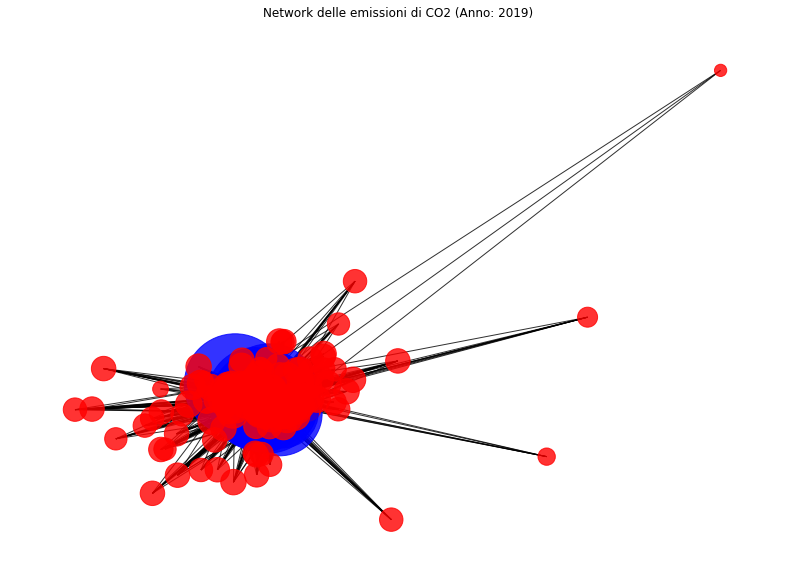

In [25]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms import bipartite


# Selezioniamo solo le colonne di interesse
df19_network = df19[["Country_code_A3", "ipcc_code_2006_for_standard_report", "Y_2019"]]

# Rimuoviamo le righe con valori mancanti nella colonna "Y_2019"
df19_network = df19_network.dropna(subset=["Y_2019"])

# Creiamo un grafo indiretto (non diretto)
G = nx.Graph()

# Aggiungiamo i nodi al grafo
for _, row in df19_network.iterrows():
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    G.add_node(country_code, label=country_code, color="red", bipartite=0, part='accountCountries')  # Nodi dal "C_group_IM24_sh" saranno rossi
    G.add_node(ipcc_code, label=ipcc_code, color="blue", bipartite=1, part='accountIndustries')        # Nodi non dal "C_group_IM24_sh" saranno blu

# Aggiungiamo gli archi al grafo con i pesi basati su "Y_2019"
for _, row in df19_network.iterrows():
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    weight = row["Y_2019"]
    # Se esiste già un arco tra i due nodi, aggiorna il peso
    #if G.has_edge(country_code, ipcc_code):
        #G[country_code][ipcc_code]['weight'] += weight
    #else:
    
    G.add_edge(country_code, ipcc_code, weight=weight)

# Posizionamento dei nodi nel plot del grafo
pos = nx.spring_layout(G, seed=42)

# Dimensione dei nodi proporzionale al grado
node_size = [v * 50 for v in dict(G.degree()).values()]

# Colori dei nodi
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Etichette dei nodi
node_labels = nx.get_node_attributes(G, "label")

# Peso degli archi
edge_weights = nx.get_edge_attributes(G, "weight")

# Creazione del plot del grafo
plt.figure(figsize=(14, 10))
nx.draw_networkx(G, pos, node_size=node_size, node_color=node_colors, with_labels=False, alpha=0.8)
#nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_weight="bold")
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_weights, font_size=8, font_color="red")

# Titolo del plot
plt.title("Network delle emissioni di CO2 (Anno: 2019)")

# Mostrare il plot del grafo
plt.axis("off")
plt.show()


# Getting basic info

In [6]:
#undirected graph
type(G)

networkx.classes.graph.Graph

In [7]:
bipartite.is_bipartite(G)

True

In [26]:
print(G)

Graph with 234 nodes and 3337 edges


In [27]:
#metadata - bipartite info
list(G.nodes(data=True))[0:5]

[('ABW',
  {'label': 'ABW',
   'color': 'red',
   'bipartite': 0,
   'part': 'accountCountries'}),
 ('1.A.1.a',
  {'label': '1.A.1.a',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries'}),
 ('1.A.2',
  {'label': '1.A.2',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries'}),
 ('1.A.4',
  {'label': '1.A.4',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries'}),
 ('1.A.5',
  {'label': '1.A.5',
   'color': 'blue',
   'bipartite': 1,
   'part': 'accountIndustries'})]

# Generating different visualizations

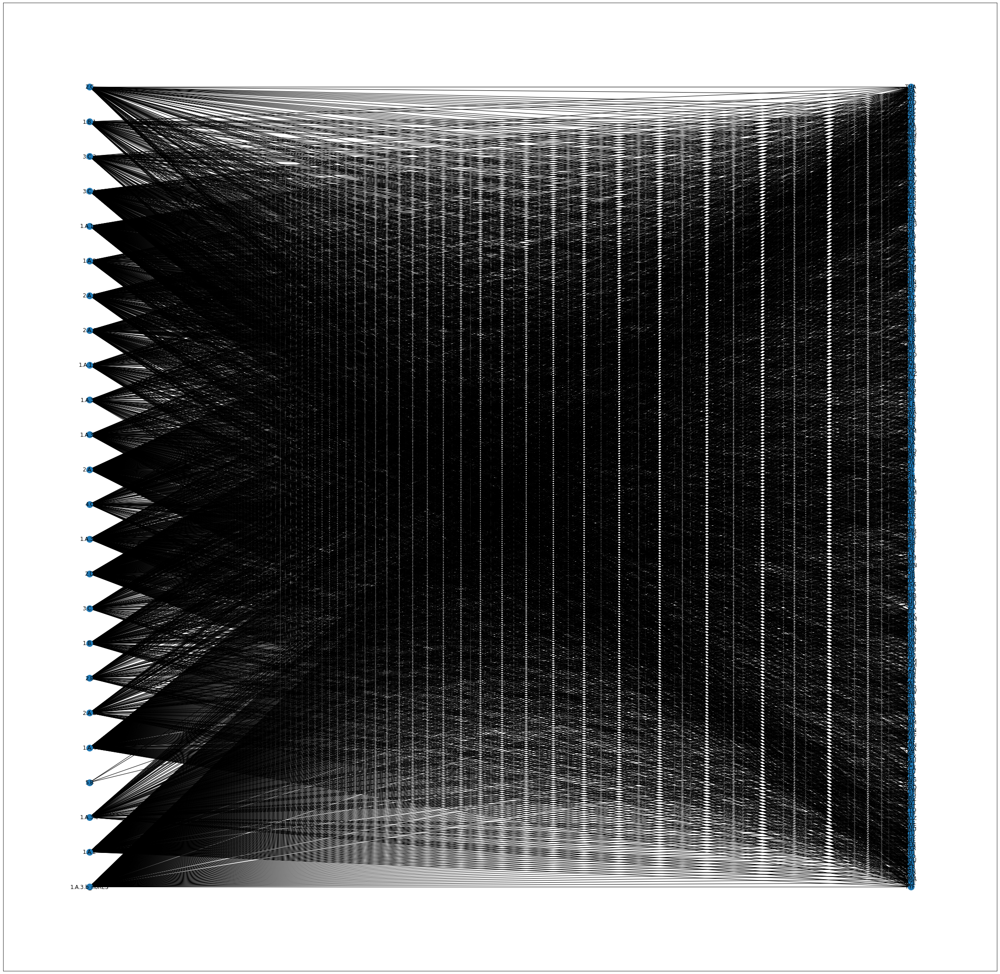

In [12]:
import networkx as nx
import matplotlib.pyplot as plt
bottom_nodes, top_nodes = bipartite.sets(G)
pos = nx.bipartite_layout(G, top_nodes)
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=True, node_size=node_size)

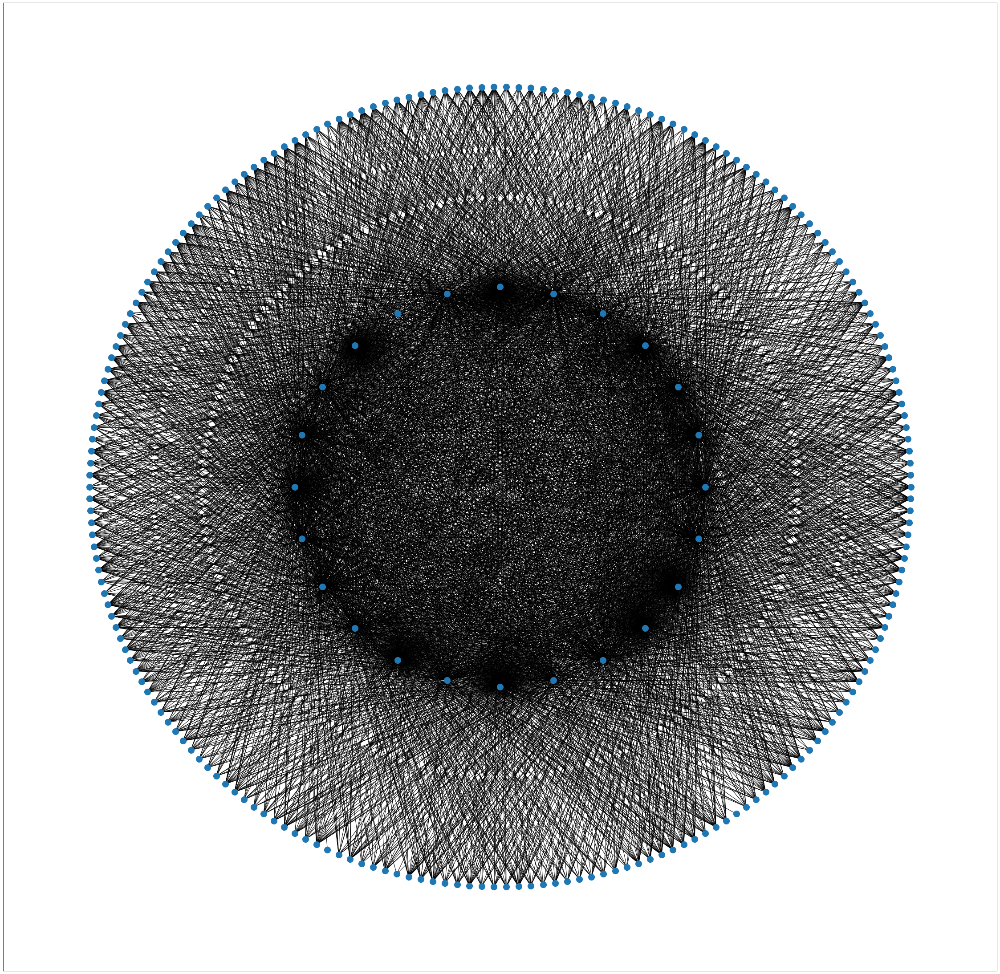

In [28]:
pos = nx.shell_layout(G, [top_nodes,bottom_nodes])
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=False, node_size=node_size)

In [14]:
print(round(bipartite.density(G, bottom_nodes), 2))

0.66


# Applying Centrality Measures

## Load Centrality

['2.A.3', '1.B.2', 'COK', '2.A.4', 'MAC']

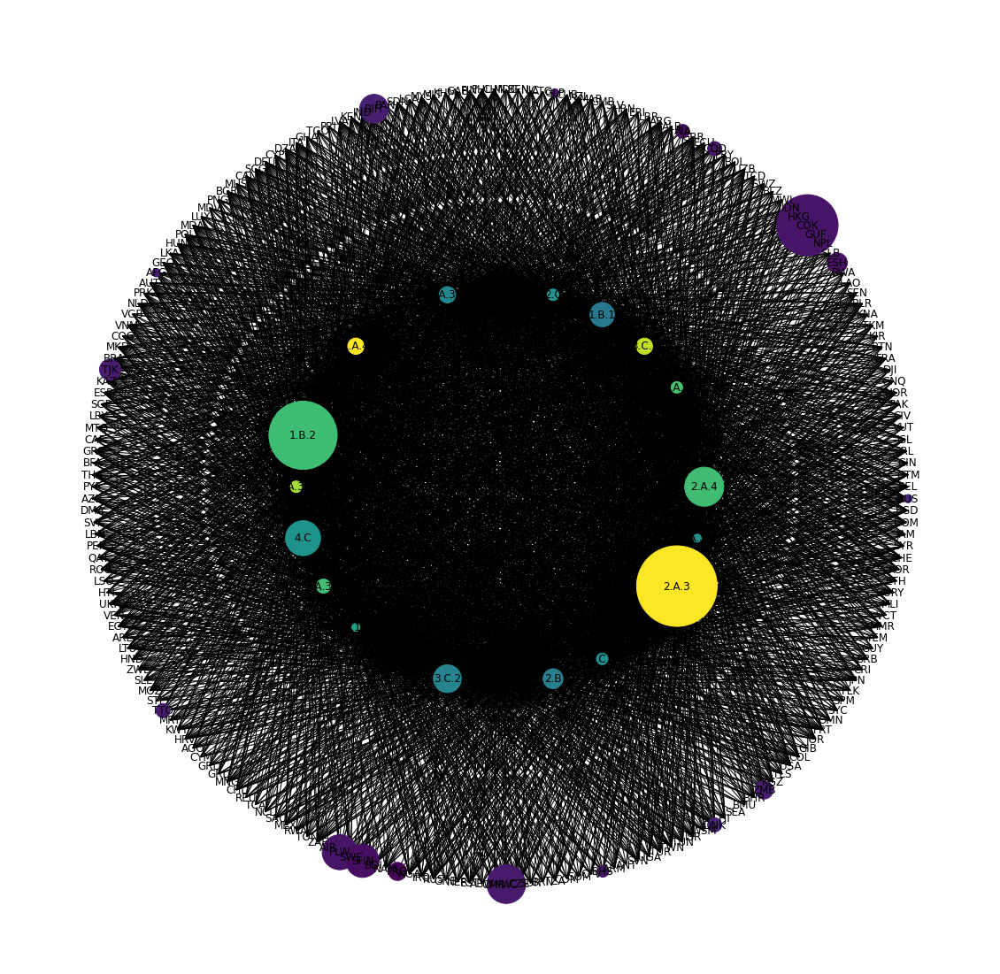

In [47]:
from networkx import load_centrality
LoadCentr=load_centrality(G, v=None, cutoff=None, normalized=True, weight='weight')
node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in LoadCentr.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=True,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(LoadCentr, key=LoadCentr.get, reverse=True)[:5]

In [50]:
load_series=pd.Series(LoadCentr)
LoadCentrNx=load_series.to_frame(name="nx_load_centr")
LoadCentrNx.sort_values(by="nx_load_centr", ascending=False)

,nx_load_centr
2.A.3,0.828252
1.B.2,0.594865
COK,0.477098
2.A.4,0.194650
MAC,0.190432
...,...
GMB,0.000000
GNB,0.000000
GNQ,0.000000
GRC,0.000000


## Laplacian centrality
reference [article](https://www.sciencedirect.com/science/article/pii/S0020025511006761) <br>
" The Laplacian energy is defined as 
<br><br>
 ![Laplacian](../img/laplacianFormula.png) <br><br>
  where λi’s are eigenvalues of the Laplacian matrix of weighted network G. The importance (centrality) of a vertex v isreflected by the drop of the Laplacian energy of the network to respond to the deactivation (deletion) of the vertex from the network "

" Laplacian centrality unveils more structural information about connectivity and density around v (further than its immediate neighborhood). That is, comparing with other standard centrality measures proposed for weighted networks (e.g. degree, closeness or betweenness centrality), Laplacian centrality is an intermediate measuring between global and local characterization of the importance (centrality) of a vertex. "

"The centrality of some vertex v is characterized as a function in terms of the numbers of 2-walks that the vertex v takes part in the network, which implies the estimation of the centrality of a vertex involves not only the direct connections with its immediate neighborhood but also the importance of its neighbors. This strategy is called “Laplacian centrality method” because it is from the use of a matrix valued function that describes the so-called “Laplacian energy” of the network. The basic idea is that the importance (centrality) of a vertex is related to the ability of the network to respond to the deactivation of the vertex from the network."

In [31]:
"""
Laplacian centrality measures.
"""
import networkx as nx

__all__ = ["laplacian_centrality"]


def laplacian_centrality(
    G, normalized=True, nodelist=None, weight="weight", walk_type=None, alpha=0.95
):
    r"""Compute the Laplacian centrality for nodes in the graph `G`.

    The Laplacian Centrality of a node ``i`` is measured by the drop in the
    Laplacian Energy after deleting node ``i`` from the graph. The Laplacian Energy
    is the sum of the squared eigenvalues of a graph's Laplacian matrix.

    .. math::

        C_L(u_i,G) = \frac{(\Delta E)_i}{E_L (G)} = \frac{E_L (G)-E_L (G_i)}{E_L (G)}

        E_L (G) = \sum_{i=0}^n \lambda_i^2

    Where $E_L (G)$ is the Laplacian energy of graph `G`,
    E_L (G_i) is the Laplacian energy of graph `G` after deleting node ``i``
    and $\lambda_i$ are the eigenvalues of `G`'s Laplacian matrix.
    This formula shows the normalized value. Without normalization,
    the numerator on the right side is returned.

    Parameters
    ----------
    G : graph
        A networkx graph

    normalized : bool (default = True)
        If True the centrality score is scaled so the sum over all nodes is 1.
        If False the centrality score for each node is the drop in Laplacian
        energy when that node is removed.

    nodelist : list, optional (default = None)
        The rows and columns are ordered according to the nodes in nodelist.
        If nodelist is None, then the ordering is produced by G.nodes().

    weight: string or None, optional (default=`weight`)
        Optional parameter `weight` to compute the Laplacian matrix.
        The edge data key used to compute each value in the matrix.
        If None, then each edge has weight 1.

    walk_type : string or None, optional (default=None)
        Optional parameter `walk_type` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        If None, the transition matrix is selected depending on the properties
        of the graph. Otherwise can be `random`, `lazy`, or `pagerank`.

    alpha : real (default = 0.95)
        Optional parameter `alpha` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        (1 - alpha) is the teleportation probability used with pagerank.

    Returns
    -------
    nodes : dictionary
       Dictionary of nodes with Laplacian centrality as the value.

    Examples
    --------
    >>> G = nx.Graph()
    >>> edges = [(0, 1, 4), (0, 2, 2), (2, 1, 1), (1, 3, 2), (1, 4, 2), (4, 5, 1)]
    >>> G.add_weighted_edges_from(edges)
    >>> sorted((v, f"{c:0.2f}") for v, c in laplacian_centrality(G).items())
    [(0, '0.70'), (1, '0.90'), (2, '0.28'), (3, '0.22'), (4, '0.26'), (5, '0.04')]

    Notes
    -----
    The algorithm is implemented based on [1]_ with an extension to directed graphs
    using the ``directed_laplacian_matrix`` function.

    Raises
    ------
    NetworkXPointlessConcept
        If the graph `G` is the null graph.

    References
    ----------
    .. [1] Qi, X., Fuller, E., Wu, Q., Wu, Y., and Zhang, C.-Q. (2012).
       Laplacian centrality: A new centrality measure for weighted networks.
       Information Sciences, 194:240-253.
       https://math.wvu.edu/~cqzhang/Publication-files/my-paper/INS-2012-Laplacian-W.pdf

    See Also
    --------
    directed_laplacian_matrix
    laplacian_matrix
    """
    import numpy as np
    import scipy as sp
    import scipy.linalg  # call as sp.linalg

    if len(G) == 0:
        raise nx.NetworkXPointlessConcept("null graph has no centrality defined")

    if nodelist != None:
        nodeset = set(G.nbunch_iter(nodelist))
        if len(nodeset) != len(nodelist):
            raise nx.NetworkXError("nodelist has duplicate nodes or nodes not in G")
        nodes = nodelist + [n for n in G if n not in nodeset]
    else:
        nodelist = nodes = list(G)

    if G.is_directed():
        lap_matrix = nx.directed_laplacian_matrix(G, nodes, weight, walk_type, alpha)
    else:
        lap_matrix = nx.laplacian_matrix(G, nodes, weight).toarray()

    full_energy = np.power(sp.linalg.eigh(lap_matrix, eigvals_only=True), 2).sum()

    # calculate laplacian centrality
    laplace_centralities_dict = {}
    for i, node in enumerate(nodelist):
        # remove row and col i from lap_matrix
        all_but_i = list(np.arange(lap_matrix.shape[0]))
        all_but_i.remove(i)
        A_2 = lap_matrix[all_but_i, :][:, all_but_i]

        # Adjust diagonal for removed row
        new_diag = lap_matrix.diagonal() - abs(lap_matrix[:, i])
        np.fill_diagonal(A_2, new_diag[all_but_i])

        new_energy = np.power(sp.linalg.eigh(A_2, eigvals_only=True), 2).sum()
        lapl_cent = full_energy - new_energy
        if normalized:
            lapl_cent = lapl_cent / full_energy

        laplace_centralities_dict[node] = lapl_cent

    return laplace_centralities_dict

In [32]:
laplacian_centrality(G, weight="weight")

{'ABW': 4.4750480362317845e-05,
 '1.A.1.a': 0.6745626000029153,
 '1.A.2': 0.21582357085898274,
 '1.A.4': 0.0584242489515551,
 '1.A.5': 0.003132358083673857,
 '1.A.3.a': 0.010932539399277868,
 '1.A.3.b_noRES': 0.1334478480403144,
 '1.A.3.d': 0.007571946398705594,
 '1.A.3.e': 0.0017897442485472288,
 '2.A.3': 9.953508851723167e-05,
 '2.A.4': 0.0019015085122093703,
 '2.D': 0.0024129839463769855,
 'AFG': 0.00022804292244217584,
 '3.C.1': 0.005971572117901519,
 '1.A.1.bc': 0.026350760740057353,
 '1.B.1': 0.014808726869039777,
 '1.B.2': 0.0017125222417002314,
 '2.A.1': 0.04083906186118994,
 '2.B': 0.011667061408792147,
 '3.C.3': 0.000927127563152397,
 'AGO': 0.0005060395491342587,
 '2.A.2': 0.01034638618585804,
 'AIA': 6.1311814867315e-07,
 'AIR': 0.00356642019678047,
 'ALB': 7.833815317878053e-05,
 '1.A.3.c': 0.001307763123891262,
 '2.C': 0.010412357503121134,
 '3.C.2': 0.00025817420154962547,
 '4.C': 0.0001675090286577951,
 'ANT': 6.008284399959543e-05,
 'ARE': 0.005861744548561398,
 'ARG':

['1.A.1.a', 'CHN', '1.A.2', 'USA', '1.A.3.b_noRES']

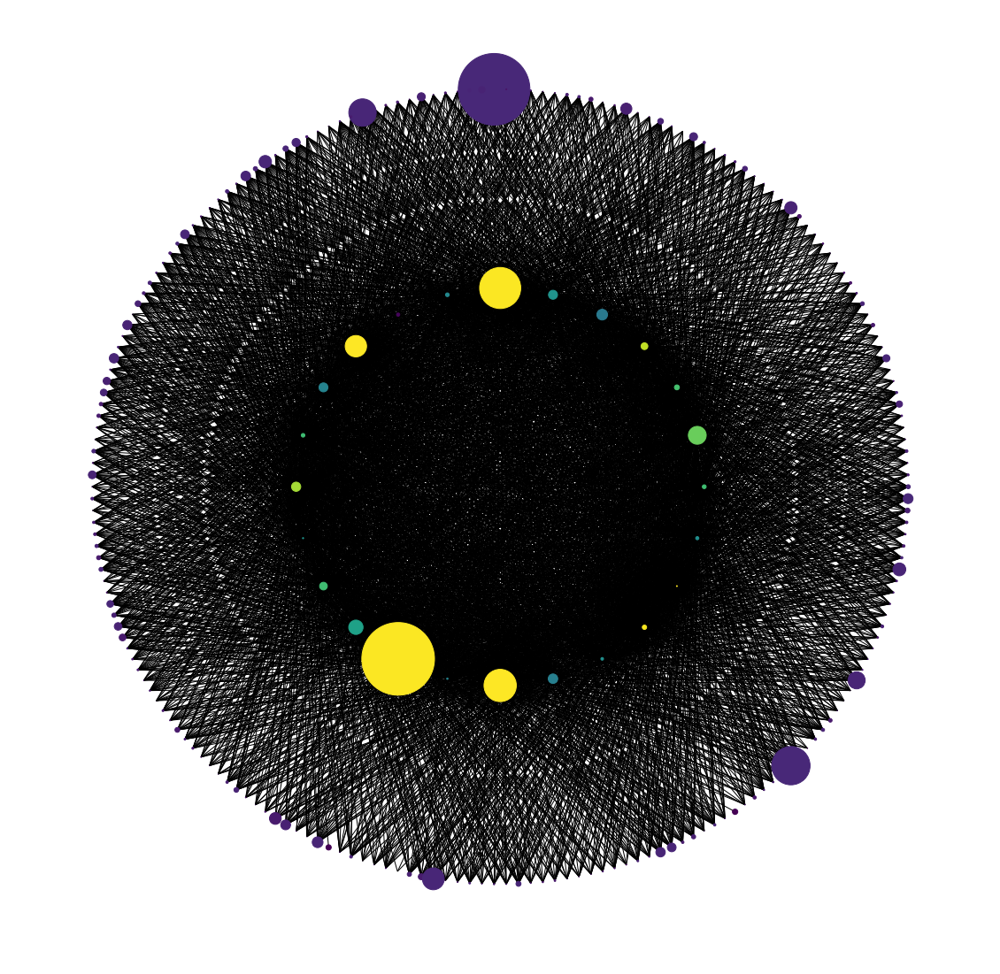

In [33]:
LaplCentr=laplacian_centrality(G, weight='weight')
node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in LaplCentr.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(LaplCentr, key=LaplCentr.get, reverse=True)[:5]

In [54]:
lapl_series=pd.Series(LaplCentr)
LaplCentrNx=lapl_series.to_frame(name="nx_lapl_centr")
LaplCentrNx.sort_values(by="nx_lapl_centr", ascending=False)

,nx_lapl_centr
1.A.1.a,6.745626e-01
CHN,6.559208e-01
1.A.2,2.158236e-01
USA,1.877659e-01
1.A.3.b_noRES,1.334478e-01
...,...
KIR,1.862244e-06
FLK,1.715683e-06
AIA,6.131181e-07
SHN,5.045389e-07


In [55]:
LaplCentrNx.to_csv('../csv/laplCentr.csv')

# Eigenvector

In [39]:
eig_centrality = nx.eigenvector_centrality_numpy(G, weight='weight')

dcs_series=pd.Series(eig_centrality)
EigCentrNx=dcs_series.to_frame(name="nx_eig_centr")
EigCentrNx.sort_values(by="nx_eig_centr", ascending=False)

,nx_eig_centr
CHN,6.413113e-01
1.A.1.a,6.096335e-01
1.A.2,3.027743e-01
USA,2.144809e-01
IND,1.429167e-01
...,...
KIR,2.858905e-06
FLK,2.838493e-06
SHN,7.132622e-07
AIA,6.527720e-07


In [59]:
EigCentrNx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 234 entries, ABW to ZWE
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   nx_eig_centr  234 non-null    float64
dtypes: float64(1)
memory usage: 3.7+ KB


In [56]:
EigCentrNx.to_csv('../csv/EigCentr.csv')

['CHN', '1.A.1.a', '1.A.2', 'USA', 'IND']

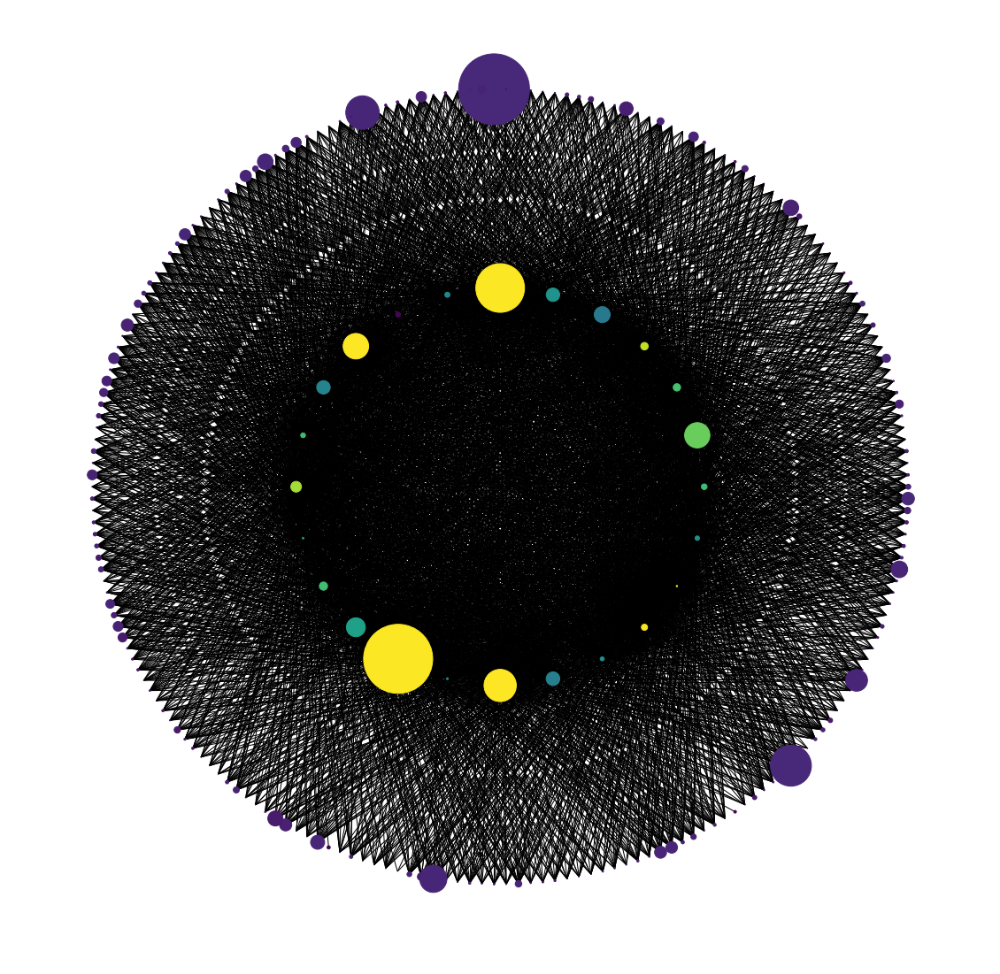

In [38]:

node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in eig_centrality.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(eig_centrality, key=eig_centrality.get, reverse=True)[:5]

# Bipartite Degree Centrality

In [34]:
bottom_nodes, top_nodes = bipartite.sets(G)
dcs = nx.bipartite.degree_centrality(G, bottom_nodes)
dcs_series=pd.Series(dcs)
BiDegCentrNx=dcs_series.to_frame(name="nx_bipartite_deg_centr")
BiDegCentrNx.sort_values(by="nx_bipartite_deg_centr", ascending=False)

,nx_bipartite_deg_centr
USA,1.000000
AUS,1.000000
CHN,1.000000
2.A.3,0.985714
1.A.3.b_noRES,0.985714
...,...
GIB,0.208333
FRO,0.125000
AIR,0.041667
SEA,0.041667


## Byrank measures

In [15]:
%pip install birankpy

Defaulting to user installation because normal site-packages is not writeable


You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


### Cleaning of the data
filter dataframe, select only interested columns and rows

In [61]:
df19_filtered= df19.filter(['ipcc_code_2006_for_standard_report','Country_code_A3', 'Y_2019'])

In [62]:
noNa=df19_filtered.dropna()
noNa

,ipcc_code_2006_for_standard_report,Country_code_A3,Y_2019
0,1.A.1.a,ABW,3.255611
1,1.A.2,ABW,7.718069
2,1.A.4,ABW,4.571319
3,1.A.5,ABW,2.004358
5,1.A.1.a,ABW,644.431576
...,...,...,...
4767,2.A.3,ZWE,0.814263
4768,2.A.4,ZWE,1.374865
4769,2.B,ZWE,10.500000
4770,2.C,ZWE,228.743089


In [63]:
import birankpy
bn = birankpy.BipartiteNetwork()

bn.set_edgelist(noNa,  top_col='ipcc_code_2006_for_standard_report', bottom_col='Country_code_A3', weight_col='Y_2019')


### Hits

In [64]:
HITSdf, _ = bn.generate_birank(normalizer='HITS')
HITSdf.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
0,1.A.1.a,0.410006
1,1.A.2,0.217139
5,1.A.3.b_noRES,0.092126
2,1.A.4,0.085620
15,2.A.1,0.053040


In [65]:
HITSdf.to_csv('../csv/HITSdf.csv')

### CoHITS

In [68]:
coHITS_df, _ = bn.generate_birank(normalizer='CoHITS')
coHITS_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
0,1.A.1.a,0.269389
1,1.A.2,0.153137
2,1.A.4,0.136831
5,1.A.3.b_noRES,0.133399
12,1.A.1.bc,0.036932


In [69]:
coHITS_df.to_csv('../csv/coHITSdf.csv')

In [72]:
br_df, _ = bn.generate_birank(normalizer='BiRank')
br_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
0,1.A.1.a,0.048331
1,1.A.2,0.037753
2,1.A.4,0.034857
5,1.A.3.b_noRES,0.034653
12,1.A.1.bc,0.021009


In [73]:
br_df.to_csv('../csv/birank_df.csv')

In [45]:
bgrm_df, _ = bn.generate_birank(normalizer='BGRM')
bgrm_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
22,4.C,0.00625
3,1.A.5,0.00625
2,1.A.4,0.00625
11,3.C.1,0.00625
5,1.A.3.b_noRES,0.00625


### Unipartite projection

In [41]:
un = bn.unipartite_projection(on='ipcc_code_2006_for_standard_report_birank')
industry_projected_pagerank_df = un.generate_pagerank()
industry_projected_pagerank_df.sort_values(by='pagerank', ascending=False).head()

,ipcc_code_2006_for_standard_report,pagerank
0,1.A.1.a,0.280240
1,1.A.2,0.193115
5,1.A.3.b_noRES,0.100894
2,1.A.4,0.094550
15,2.A.1,0.058349


### Countries

In [35]:
import birankpy
countryfirst_bn = birankpy.BipartiteNetwork()

countryfirst_bn.set_edgelist(noNa, top_col='Country_code_A3', bottom_col='ipcc_code_2006_for_standard_report',  weight_col='Y_2019')


In [38]:
HITSdf, _ = countryfirst_bn.generate_birank(normalizer='HITS')
HITSdf.sort_values(by='Country_code_A3_birank', ascending=False).head()

,Country_code_A3,Country_code_A3_birank
36,CHN,0.333167
198,USA,0.118201
90,IND,0.088528
160,RUS,0.047701
99,JPN,0.031956


In [40]:
coHITSdf, _ = countryfirst_bn.generate_birank(normalizer='CoHITS')
coHITSdf.sort_values(by='Country_code_A3_birank', ascending=False).head()

,Country_code_A3,Country_code_A3_birank
36,CHN,0.224305
198,USA,0.106653
90,IND,0.067896
160,RUS,0.039330
27,BRA,0.025658


### Unipartite Projection

In [43]:
country_un = countryfirst_bn.unipartite_projection(on='Country_code_A3')
country_projected_pagerank_df = country_un.generate_pagerank()
country_projected_pagerank_df.sort_values(by='pagerank', ascending=False).head()

,Country_code_A3,pagerank
36,CHN,0.204857
198,USA,0.107397
90,IND,0.077806
160,RUS,0.042837
99,JPN,0.029829


# Eigenvector ? 
maybe on the unipartite projection

# comparing  centrality measures
 CREARE TABELLA! con rows= nodi e columns = different measures 

# use Unipartite projection for clustering coefficient? 
for grouping the countries

# small world?

# Degree distribution?
Check if it corresponds to one of the ones in lecture 6

# cohesion e connectedness?

# proj matrix

In [75]:
import numpy as np
import networkx as nx


# Convert the bipartite graph to a weighted adjacency matrix
adj_matrix = nx.bipartite.biadjacency_matrix(G, row_order=list(top_nodes), column_order=list(bottom_nodes))

# Normalize the adjacency matrix to create a stochastic matrix
row_sums = adj_matrix.sum(axis=1)
stochastic_matrix = adj_matrix / row_sums[:, np.newaxis]

# Calculate the dominant eigenvector using NumPy
eigenvalues, eigenvectors = np.linalg.eig(stochastic_matrix.T)
dominant_eigenvector = eigenvectors[:, np.argmax(eigenvalues)]

# Normalize the eigenvector to obtain eigenvector centrality scores
eigenvector_centrality = dominant_eigenvector / np.sum(dominant_eigenvector)

print("Eigenvector Centrality Scores:", eigenvector_centrality)


ValueError: shape too large to be a matrix.

# From Graph to matrix

In [78]:
import numpy as np
%pip install scipy
from scipy.sparse import csr_matrix

# from graph to matrix
m = nx.adjacency_matrix( G ).A # the ndarray version of the matrix

# transpose
m_t = m.transpose()

# generic matrix combination operation
def combine( m1, m2, op ):
    assert( np.shape( m1 ) == np.shape( m2 ) )
    dim = np.shape( m1 )
    if ( len( dim ) == 1 ):
        res = np.array( m1 )
        for i in range( 0, dim[ 0 ] ):
            res[ i ] = op( m1[ i ], m2[ i ] )
        return res
    else:
        res = np.array( m1 )
        for i in range( 0, dim[ len( dim ) - 1 ] ):
            res[ i ] = combine( m1[ i ], m2[ i ], op )
        return res
    
SYM_UNION = (lambda x, y: x | y)     # OR
SYM_INTERSECT = (lambda x, y: x & y) # AND

# symmetrisation (via transpose)
sym_uni = combine( m, m_t, SYM_UNION )
sym_int = combine( m, m_t, SYM_INTERSECT )
#print( np.matrix( sym_uni ) )
#print( np.matrix( sym_int ) )

g_uni = nx.from_numpy_matrix( sym_uni, create_using=nx.DiGraph )
#nx.draw_networkx( g_uni )
g_int = nx.from_numpy_matrix( sym_int, create_using=nx.DiGraph )
#nx.draw_networkx( g_int )

m_sum = combine( m, m_t, (lambda x, y: x + y ) )

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement scipy.sparse (from versions: none)
ERROR: No matching distribution found for scipy.sparse
You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


TypeError: ufunc 'bitwise_or' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''